In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/netflix-shows/netflix_titles.csv


In [22]:
df = pd.read_csv('/kaggle/input/netflix-shows/netflix_titles.csv')

In [3]:
type(df)

pandas.core.frame.DataFrame

In [4]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [5]:
df.shape

(8807, 12)

In [6]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

# Libraries

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [8]:
df.describe(include = 'all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,8807,8807,8807,6173,7982,7976,8797,8807.000000,8803,8804,8807,8807
unique,8807,2,8807,4528,7692,748,1767,NaN,17,220,514,8775
top,s1,Movie,Dick Johnson Is Dead,Rajiv Chilaka,David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,"Dramas, International Movies","Paranormal activity at a lush, abandoned prope..."
freq,1,6131,1,19,19,2818,109,NaN,3207,1793,362,4
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014.180198,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.819312,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019.000000,NaN,NaN,NaN,NaN


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


In [10]:
df.nunique()

show_id         8807
type               2
title           8807
director        4528
cast            7692
country          748
date_added      1767
release_year      74
rating            17
duration         220
listed_in        514
description     8775
dtype: int64

#### Percentage of Null values in each Column

In [11]:
df.isnull().sum()/len(df)*100

show_id          0.000000
type             0.000000
title            0.000000
director        29.908028
cast             9.367549
country          9.435676
date_added       0.113546
release_year     0.000000
rating           0.045418
duration         0.034064
listed_in        0.000000
description      0.000000
dtype: float64

In [12]:
total_null = df.isnull().sum().sort_values(ascending = False)
percent = ((df.isnull().sum()/df.isnull().count())*100).sort_values(ascending = False)
print("Total records = ", df.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(10)

Total records =  8807


,Total Missing,In Percent
director,2634,29.91
country,831,9.44
cast,825,9.37
date_added,10,0.11
rating,4,0.05
duration,3,0.03
show_id,0,0.00
type,0,0.00
title,0,0.00
release_year,0,0.00


# Dealing With Null Values

### Duration

In [61]:
df = df.dropna(subset=['duration'])

In [62]:
df.shape

(8804, 12)

### Rating

In [63]:
df['rating'] = df['rating'].replace(np.nan, 'Unknown Duration')

In [65]:
total_null = df.isnull().sum().sort_values(ascending = False)
percent = ((df.isnull().sum()/df.isnull().count())*100).sort_values(ascending = False)
print("Total records = ", df.shape[0])

missing_data = pd.concat([total_null,percent.round(2)],axis=1,keys=['Total Missing','In Percent'])
missing_data.head(10)

Total records =  8804


,Total Missing,In Percent
director,2634,29.92
country,831,9.44
cast,825,9.37
date_added,10,0.11
show_id,0,0.00
type,0,0.00
title,0,0.00
release_year,0,0.00
rating,0,0.00
duration,0,0.00


# What percentage are movies and what percentage are TV shows?

In [23]:
content_types = df['type'].value_counts()
content_types

Movie      6131
TV Show    2676
Name: type, dtype: int64

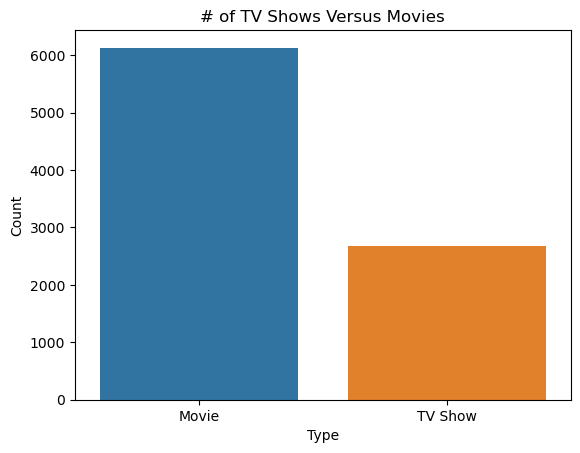

In [28]:
sns.barplot(x=content_types.index, y=content_types.values)  # Also you can use `sns.countplot`
plt.xlabel('Type')
plt.ylabel('Count')
plt.title('# of TV Shows Versus Movies')
plt.savefig('No. of TV Shows Versus Movies.pdf')
plt.show()

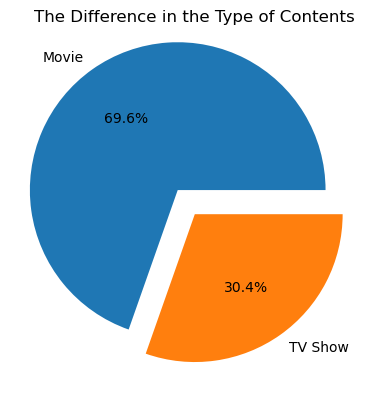

In [31]:
plt.pie(x=content_types.values, labels=content_types.index, autopct='%.1f%%', explode=[.2, 0])
plt.title('The Difference in the Type of Contents')
plt.show()

# Countries with the highest amount of production?

In [40]:
top_producing_countries = (
    df['country']
    .str.split(', ')
    .explode()
    .value_counts()
    .head(10)
)
top_producing_countries

United States     3689
India             1046
United Kingdom     804
Canada             445
France             393
Japan              318
Spain              232
South Korea        231
Germany            226
Mexico             169
Name: country, dtype: int64

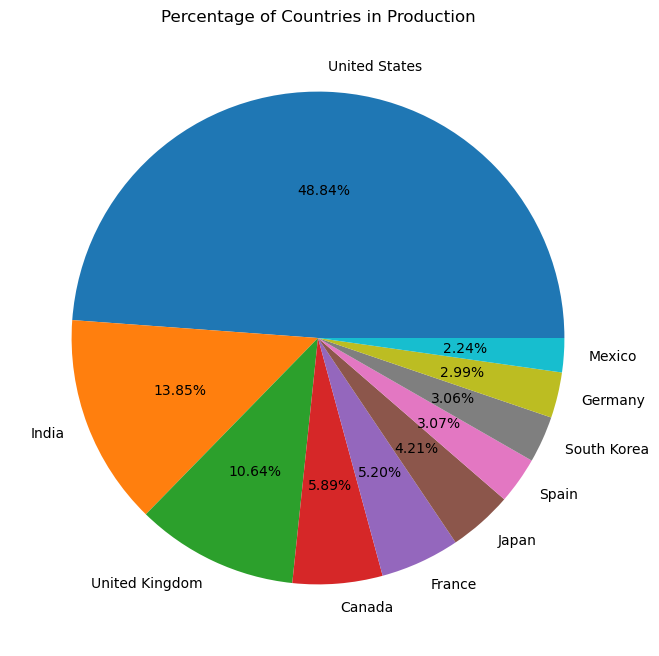

In [41]:
plt.figure(figsize=(9, 8))
plt.pie(x=top_producing_countries.values, labels=top_producing_countries.index, autopct='%.2f%%')
plt.title('Percentage of Countries in Production')
plt.show()

###### try plotting barplot

# What are the types of rating system?

In [42]:
most_used_ratings = (
    df['rating']
    .value_counts()
    .head(10)
)
most_used_ratings

TV-MA    3207
TV-14    2160
TV-PG     863
R         799
PG-13     490
TV-Y7     334
TV-Y      307
PG        287
TV-G      220
NR         80
Name: rating, dtype: int64

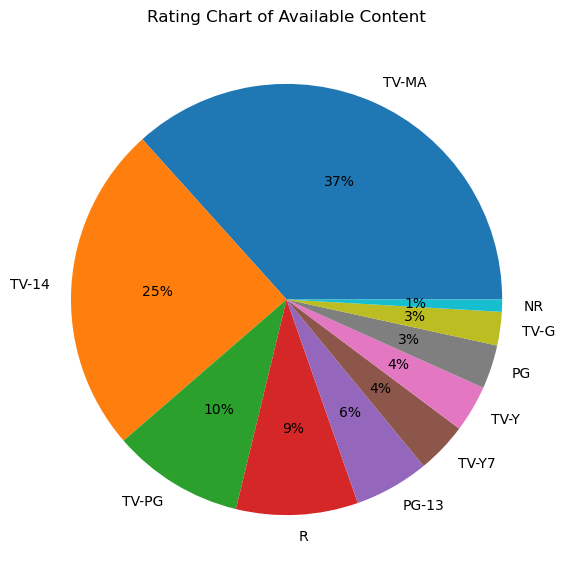

In [43]:
plt.figure(figsize=(8, 7))
plt.pie(x=most_used_ratings.values, labels=most_used_ratings.index, autopct='%.0f%%')
plt.title('Rating Chart of Available Content')
plt.show()

# The most commonly produced genres?

In [44]:
most_produced_geners = (
  df['listed_in']
  .str.split(', ')
  .explode()
  .value_counts()
  .head(30)
)
most_produced_geners

International Movies         2752
Dramas                       2427
Comedies                     1674
International TV Shows       1351
Documentaries                 869
Action & Adventure            859
TV Dramas                     763
Independent Movies            756
Children & Family Movies      641
Romantic Movies               616
TV Comedies                   581
Thrillers                     577
Crime TV Shows                470
Kids' TV                      451
Docuseries                    395
Music & Musicals              375
Romantic TV Shows             370
Horror Movies                 357
Stand-Up Comedy               343
Reality TV                    255
British TV Shows              253
Sci-Fi & Fantasy              243
Sports Movies                 219
Anime Series                  176
Spanish-Language TV Shows     174
TV Action & Adventure         168
Korean TV Shows               151
Classic Movies                116
LGBTQ Movies                  102
TV Mysteries  

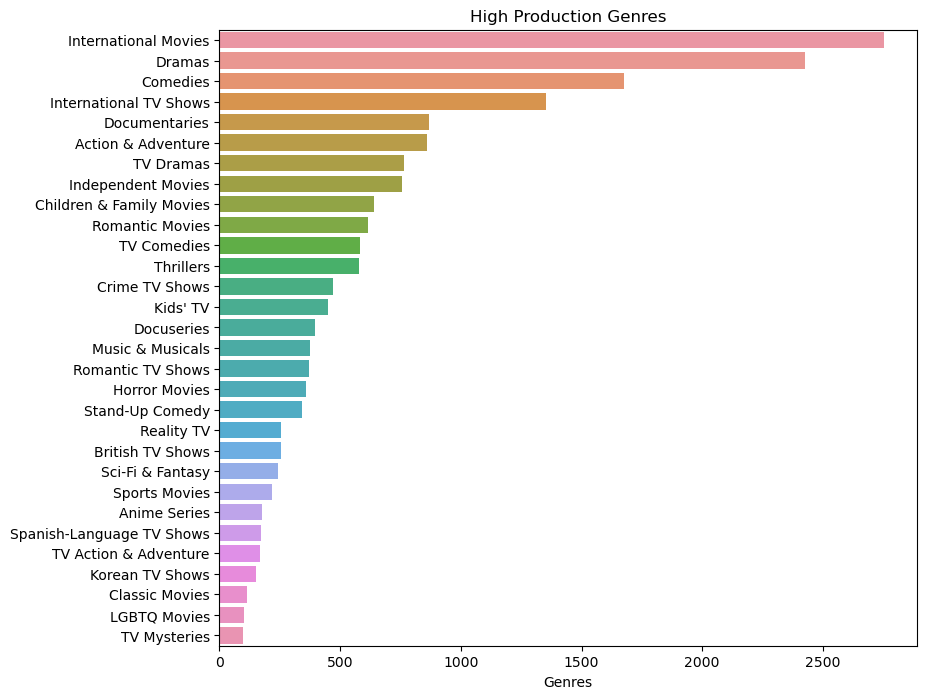

In [45]:
plt.figure(figsize=(9, 8))
sns.barplot(x=most_produced_geners.values, y=most_produced_geners.index)
plt.xlabel('Genres')
plt.title('High Production Genres')
plt.show()

# What month has the most content added to Netflix?

In [46]:
months_name = (
    pd.to_datetime(df['date_added'])
    .dt.month_name()
)
months_name

0       September
1       September
2       September
3       September
4       September
          ...    
8802     November
8803         July
8804     November
8805      January
8806        March
Name: date_added, Length: 8807, dtype: object

In [49]:
dates = pd.to_datetime(df['date_added'])

In [51]:
type(dates[0])

pandas._libs.tslibs.timestamps.Timestamp

In [48]:
months_name.value_counts()

July         827
December     813
September    770
April        764
October      760
August       755
March        742
January      738
June         728
November     705
May          632
February     563
Name: date_added, dtype: int64

# WordCloud of TV Description

In [60]:
from wordcloud import WordCloud, STOPWORDS

plt.rcParams['figure.figsize'] = (130, 130)

#assigning shape to the word cloud
wordcloud = WordCloud(max_words=1000000,background_color="white").generate(' '.join(df['description']))

plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()